# Classifying MLB Pitch Zones and Predicting MiLB Zone

## Statcast Pitch Classification

### Zones

Within the MLB Stats API and Baseball Savant API, pitch locations are classified into 12 zones, as illustrated in Figure 1. These zones, as seen from the catcher’s perspective, define the strikezone and relative locations of a pitch. For example, a pitch inside “Zone 1” would be classified as a “Strike” and “up and away” to a left handed batter. In the same vein, a pitch located in zone 11, 12, 13, or 14 (and beyond) is outside of the strikezone, and would be classified as as “Ball”

All pitches located in Zones 1–9 are considered “In-Zone”

All pitches located in Zones 11–14 are considered “Out-of-Zone”


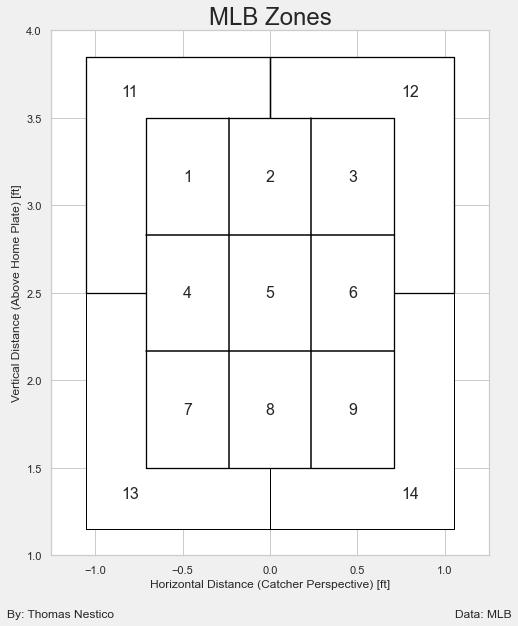

### Zone Metrics

The zone classification of pitches allow analysts to calculate plate discipline metrics beyond the conventional metrics such as Whiff% and Swing%. An example of a metric that can be calculated using these zone classifications is Out-of-zone Swing Rate, also known as Chase% or O-Swing%. O-Swing% calculates the rate at which a batter swings at pitches that are “Out-of-zone”, and is a large driver in a batter’s plate discipline outcomes. Intuitively, batters which swing at fewer pitches outside the zone tend to have higher walk rates (BB%). The more “Balls” a batter takes, the more likely they will walk.

Another example of a zone plate discipline metric is In-Zone Swing Rate (Z-Swing%). Similar to O-Swing%, Z-Swing% calculates the number of pitches “In-Zone” which a batter swings. In terms of contact, batters perform significantly better against pitches that are thrown inside the strikezone than ones that are not. The following table summarizes the Estimated wOBA on Contact (xwOBACON) for pitches inside and outside of the strikezone during the 2023 MLB Season.


Table 1: 2023 MLB xwOBACON In-Zone and Out-of-Zone
| In Zone   |   xwOBACON |
|:----------|-----------:|
| False     |   0.284 |
| True      |   0.393 |

Batters which consistently swing at pitches inside the strikezone are more likely to perform at a higher level than those that do not. Figure 2 illustrates the xwOBACON of each of the zones during the 2023 MLB Season. Pitches thrown near the heart of the plate tend to be more favourable for batters compared to those further away from the centre.

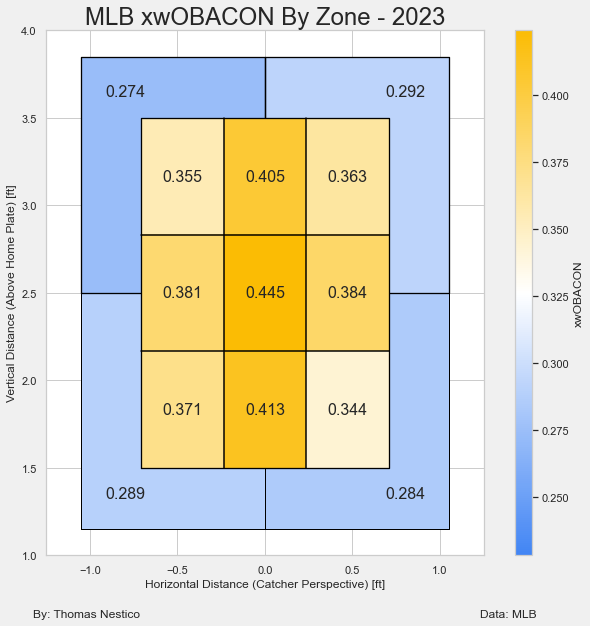


## MLB Gameday

MLB Gameday is an app created by Major League Baseball which allows you to follow games in real-time, including scores and pitch-by-pitch data. Figure 3 shows a screenshot of MLB Gameday.

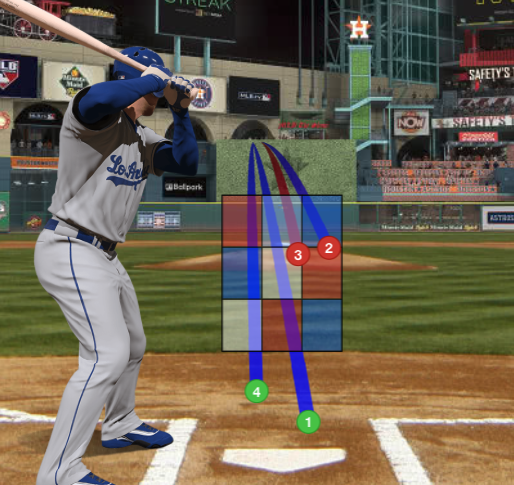

### Pitch Locations
In games which have Statcast, the MLB API provides two different coordiante systems for pitch locations. For simplicity, I will refer to these systems as the “Statcast” and “Gameday” coordinate systems. Using these systems, The location of a pitch is defined as:

* Statcast

    * pX — Horizontal position in feet of the ball as it crosses the front axis of home plate.
    * pZ — Vertical position in feet above home plate of the ball as it crosses the front axis of home plate.

* Gameday

    * x — X coordinate where pitch crossed front of home plate in pixels from the origin.
    * y — Y coordinate where pitch crossed front of home plate in pixels from the origin.

These definitions read very similarly, but the Gameday coordinates are in pixels from an unknown origin and there are no “Zones”. Plotting each system will help us compare them and see if there are any discrepancies.


## Plotting Statcast vs Gameday Pitch Locations

The dataset used contains all the pitches during the 2023 MLB Season and their respective pitch locations in both the Statcast and Gameday Coordinate System. Additionally, the Statcast Zone Types are defined for each pitch. This data was gathered from the MLB Stats API.

First we will take a look at the distribution of pitches in the dataset, and also the distribution of “In-Zone” vs ‘Out-of-Zone’ Pitches.


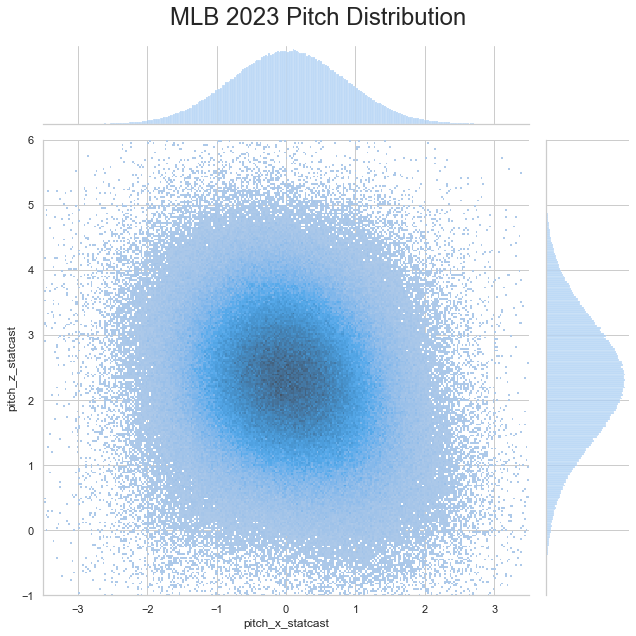

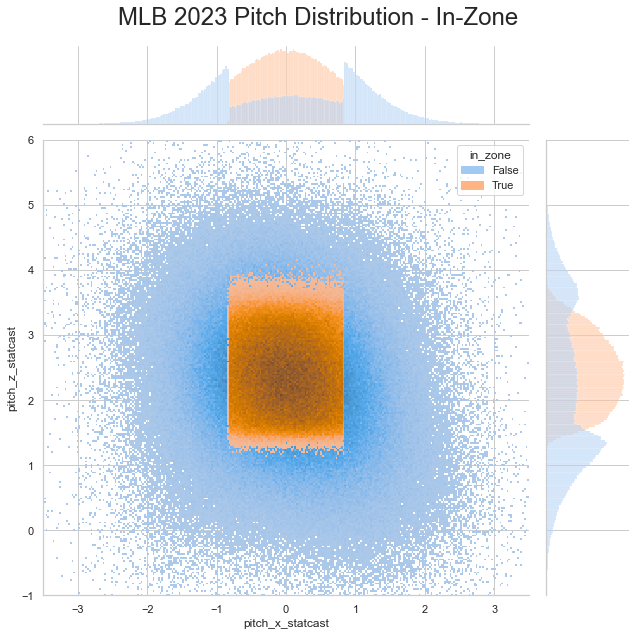

In [1]:
## Import packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy

## Import Data Set
df = pd.read_csv('data/pitch_locations.csv',index_col=[0])

## Define In-Zone vs Out-of-Zone Pitches
df['in_zone'] = df.zone < 10

sns.set_theme(style="whitegrid", palette="pastel")
#fig, ax = plt.subplots(figsize=(9,9))
ha = sns.jointplot(data=df, x="pitch_x_statcast", y="pitch_z_statcast",height=9,kind='hist',xlim=(-3.5,3.5),ylim=(-1,6))
hb = sns.jointplot(data=df, x="pitch_x_statcast", y="pitch_z_statcast",height=9,kind='hist',xlim=(-3.5,3.5),ylim=(-1,6),hue='in_zone')

ha.fig.suptitle("MLB 2023 Pitch Distribution",fontsize=24)
ha.fig.subplots_adjust(top=0.92)
hb.fig.suptitle("MLB 2023 Pitch Distribution - In-Zone",fontsize=24)
hb.fig.subplots_adjust(top=0.92)

The distribution of pitch locations is normal. It is interesting to note that the distribution for “In-Zone” pitches along the x-direction truncates abruptly, rather than following a similar distribution as the z-direction distribution. This observation makes sense as the bounds of the zone in the x-direction are fixed in relation to the width of home plate and the bounds of the z-direction vary depending on the batter.

Now let’s take a look at the relationship between the Statcast and Gameday Systems.


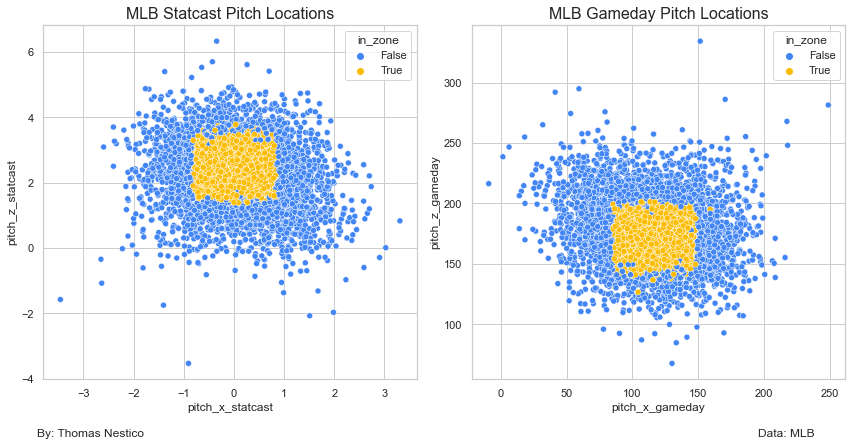

In [2]:
## Set Up Plot and Style
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(12,6))

### Plot the first 5000 Points for simplicity
## Plot Statcast Pitch Locations
sns.scatterplot(data=df.head(5000),x='pitch_x_statcast',y='pitch_z_statcast',hue='in_zone',ax=ax[0],palette=["#4285F4",'#FBBC04'])
## Plot Gameday Pitch Locations
sns.scatterplot(data=df.head(5000),x=df.head(5000)['pitch_x_gameday']*1,y=df.head(5000)['pitch_z_gameday']*1,hue=df.head(5000)['in_zone'],ax=ax[1],palette=["#4285F4",'#FBBC04'])

## Add titles and Text
fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('MLB Statcast Pitch Locations',fontsize=16)
ax[1].set_title('MLB Gameday Pitch Locations',fontsize=16)
plt.tight_layout()

At first glance, we can tell a major differences in the two systems.
1) The Gameday System seems to be rotated 180° from the Statcast System. From this, we can infer that the origin of the Gameday System seems to be above the strikezone and to the right (catcher’s perspective) where positive values indicate distance below the origin (towards the ground) and to the left (catcher’s persepctive)

Let’s transform the plot, so they are both in the same orientation.


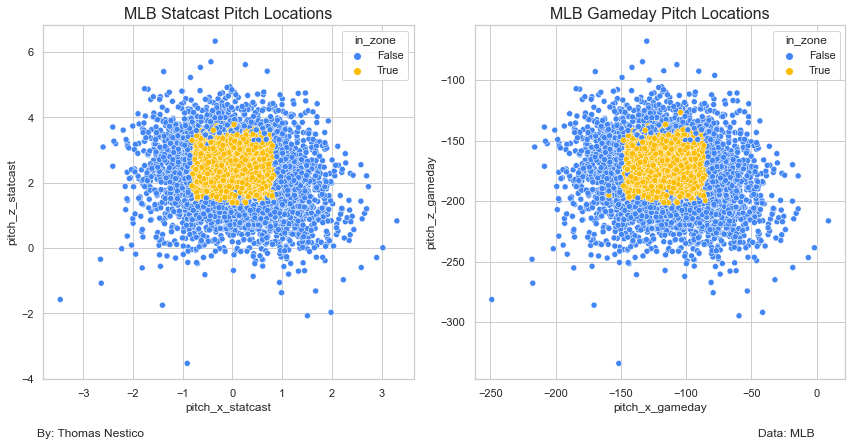

In [3]:
## Import packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## Set Up Plot and Style
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(12,6))

### Plot the first 5000 Points for simplicity
## Plot Statcast Pitch Locations
sns.scatterplot(data=df.head(5000),x='pitch_x_statcast',y='pitch_z_statcast',hue='in_zone',ax=ax[0],palette=["#4285F4",'#FBBC04'])
## Plot Gameday Pitch Locations, Multiply both x and y by -1 to rotate by 180°
sns.scatterplot(data=df.head(5000),x=df.head(5000)['pitch_x_gameday']*-1,y=df.head(5000)['pitch_z_gameday']*-1,hue=df.head(5000)['in_zone'],ax=ax[1],palette=["#4285F4",'#FBBC04'])

## Add titles and Text
fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('MLB Statcast Pitch Locations',fontsize=16)
ax[1].set_title('MLB Gameday Pitch Locations',fontsize=16)
plt.tight_layout()


Now that we have the systems aligned, we can identify another main difference:

1) The Statcast System’s origin (0,0) is located at the centre of home plate and at a distance of 0 ft above home plate. The Gameday system’s origin (0,0) is not plotted, as no pitches in this system are near the origin.

Despite this difference, the pitch locations in both systems are relatively similar. Let’s take a look at the relationship between the Statcast and Gameday coordinates. A scatter plot will illustrate the relationship (if any) between the coordinate systems.


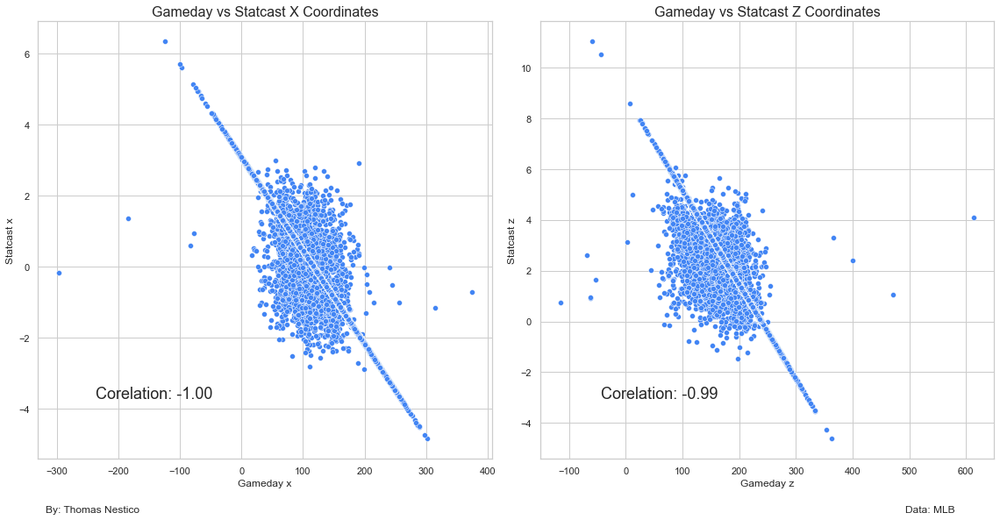

In [4]:
## Set up the axes
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(16,8))

## Plot Gameday x coordinate vs Statcast x coordinate
sns.scatterplot(data=df,x='pitch_x_gameday',y='pitch_x_statcast',ax=ax[0],c=["#4285F4"])
ax[0].set_ylabel('Statcast x')
ax[0].set_xlabel('Gameday x')
fig.text(s=f"Corelation: {round(df['pitch_x_gameday'].corr(df['pitch_x_statcast']),2):.2f}",x=0.1,y=0.2,fontsize=18)

## Plot Gameday z coordinate vs Statcast z coordinate
sns.scatterplot(data=df,x=df['pitch_z_gameday'],y=df['pitch_z_statcast'],ax=ax[1],c=["#4285F4"])
ax[1].set_ylabel('Statcast z')
ax[1].set_xlabel('Gameday z')
fig.text(s=f"Corelation: {round(df['pitch_z_gameday'].corr(df['pitch_z_statcast']),2):.2f}",x=0.6,y=0.2,fontsize=18)


fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('Gameday vs Statcast X Coordinates',fontsize=16)
ax[1].set_title('Gameday vs Statcast Z Coordinates',fontsize=16)
plt.tight_layout()

The relationship between the Gameday and Statcast coordinates is linear. A linear regression model can be trained to predict Statcast locations from Gameday locations, and vice versa. Additionally, since Statcast data includes both the zones and the Gameday system, a classification machine learning model can be trained to predict zone locations using Gameday data. This means that in instances where only Gameday data is available (like MiLB games), both Statcast pitch locations and zones can be predicted.

### Training a Regression Model - Linear

As we can see, the Gameday Data is somewhat noisy, as not all the Gameday locations follow the same linear relationship. To address this, we can train a linear regression model to help identify and potentially remove the noisy data, which will allow our zone location classification model to perform better.

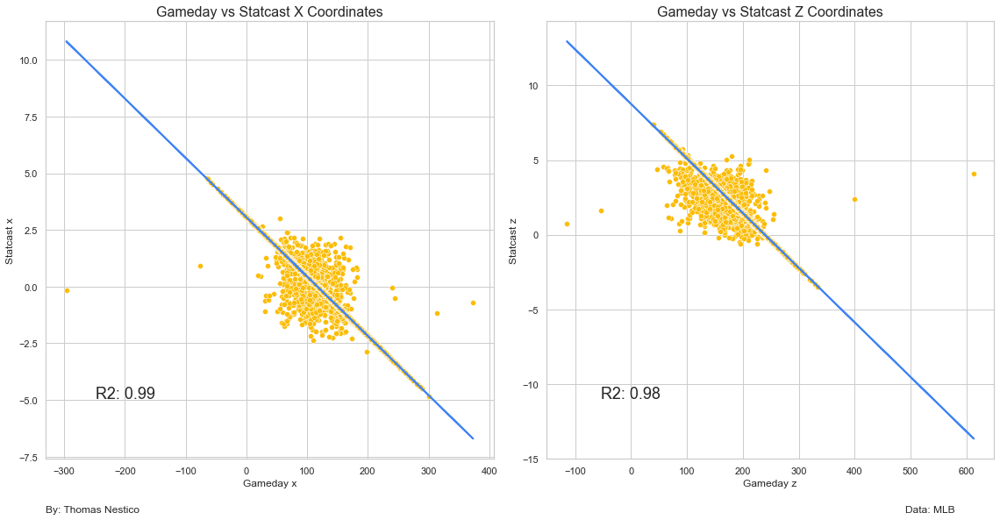

In [5]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

features_x = ['pitch_x_gameday']
target_x = ['pitch_x_statcast']

features_z = ['pitch_z_gameday']
target_z = ['pitch_z_statcast']
# create variable for feature data and target data
X_x = df[features_x].values
y_x = df[target_x].values

X_z = df[features_z].values
y_z = df[target_z].values
# y = target_data.replace(True,1)
# y = target_data.replace(False,0)
# split data
X_train_x, X_test_x, y_train_x, y_test_x = train_test_split(X_x, y_x, test_size=0.3, random_state=10)

X_train_z, X_test_z, y_train_z, y_test_z = train_test_split(X_z, y_z, test_size=0.3, random_state=10)

# Create and train a Random Forest model
linear_reg_model_x = LinearRegression()
linear_reg_model_x.fit(X_train_x, y_train_x)

linear_reg_model_z = LinearRegression()
linear_reg_model_z.fit(X_train_z, y_train_z)

y_pred_x = linear_reg_model_x.predict(X_test_x)
y_pred_z = linear_reg_model_z.predict(X_test_z)

# Plot the regression line
colour_list = ["#4285F4",'#FBBC04']

fig, ax = plt.subplots(1,2,figsize=(16,8))
sns.scatterplot(x=X_test_x[:][:,0],y=y_test_x[:][:,0],ax=ax[0],color=colour_list[1])
ax[0].plot(X_test_x, y_pred_x,  linewidth=2,color=colour_list[0])
sns.scatterplot(x=X_test_z[:][:,0],y=y_test_z[:][:,0],ax=ax[1],color=colour_list[1])
ax[1].plot(X_test_z, y_pred_z, linewidth=2,color=colour_list[0])

ax[0].set_ylabel('Statcast x')
ax[0].set_xlabel('Gameday x')

ax[1].set_ylabel('Statcast z')
ax[1].set_xlabel('Gameday z')

fig.text(s=f"R2: {r2_score(y_test_x, y_pred_x):.2f}",x=0.1,y=0.2,fontsize=18)
fig.text(s=f"R2: {r2_score(y_test_z, y_pred_z):.2f}",x=0.6,y=0.2,fontsize=18)


fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('Gameday vs Statcast X Coordinates',fontsize=16)
ax[1].set_title('Gameday vs Statcast Z Coordinates',fontsize=16)
plt.tight_layout()


The Coefficient of Determination (R2) is extremely close to 1, which indicates that independent variable (Gameday Location) greatly explains the variability of the dependent variable (Statcast Location).

Let’s take a look at the Residuals of the model to sense if there is any pattern to the data that does not follow the linear relationship.


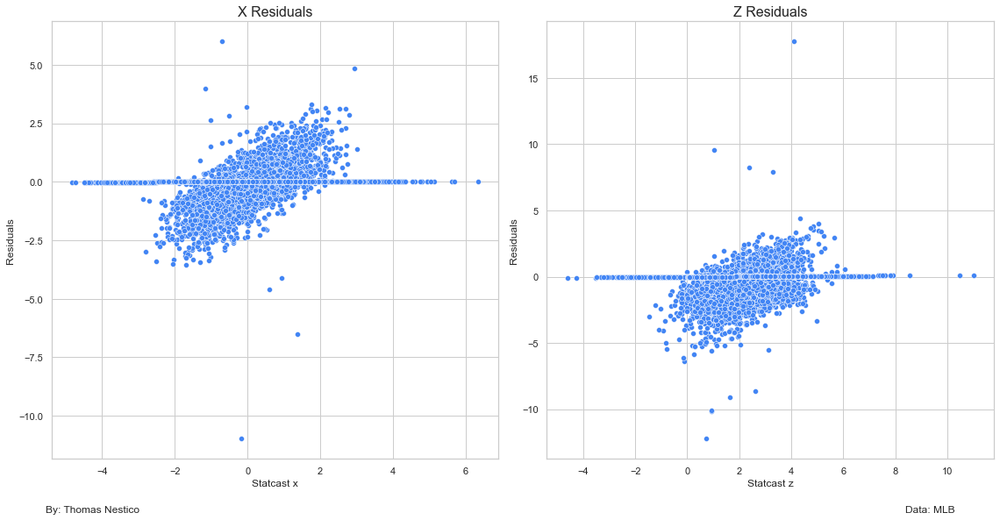

In [6]:
## Predict Statcast Coordiantes Given the Gameday Coordinates
df['pitch_x_statcast_new'] = linear_reg_model_x.predict(np.array(df[['pitch_x_gameday']]))
df['pitch_z_statcast_new'] = linear_reg_model_z.predict(np.array(df[['pitch_z_gameday']]))

## Calcaute residuals between Actual Statcast Coordinates and Predicted Statcast Coordiantes

df['residuals_x'] = df['pitch_x_statcast'] - df['pitch_x_statcast_new']
df['residuals_z'] = df['pitch_z_statcast'] - df['pitch_z_statcast_new']

## Set up the axes
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(16,8))

## Plot Gameday x coordinate vs Statcast x coordinate
sns.scatterplot(data=df,x='pitch_x_statcast',y='residuals_x',ax=ax[0],c=["#4285F4"])
ax[0].set_ylabel('Residuals')
ax[0].set_xlabel('Statcast x')


## Plot Gameday z coordinate vs Statcast z coordinate
sns.scatterplot(data=df,x=df['pitch_z_statcast'],y=df['residuals_z'],ax=ax[1],c=["#4285F4"])
ax[1].set_ylabel('Residuals')
ax[1].set_xlabel('Statcast z')


fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('X Residuals',fontsize=16)
ax[1].set_title('Z Residuals',fontsize=16)
plt.tight_layout()

There does seem to be a slight correlation between the corresponding direction and the residual size. However, there are multiple points which have drastically different residual values. Since we know the relationship is effectively linear, we can make an assumption that all data that falls outside a specific residual threshold was data which was incorrectly collected, and therefore can be removed from the dataset.

As a sanity check, we can take a look at an “outlier” pitch to see if there is a discrepancy in the original Statcast Data vs the Gameday Data.


There is a pitch in the dataset which have the following metrics:

| Metric   |   Value |
|:----------|-----------:|
|pitch_x_statcast       |     1.96 |
|pitch_z_statcast       |    -0.16 |
|pitch_x_statcast_new   |     0.28 |
|pitch_z_statcast_new   |     5.95 |
|zone                   |     14 |

According to these metrics, the actual location of the pitch was down and to the right of the catcher, which is where zone 14 is located. According to the predicted location, this pitch was thrown approximately 6ft above the centre home plate, which would be in zone 12.

Thankfully, MLB has a repository of all pitches from the 2023 season, so we can verify the location of the pitch. Let’s take a look at that pitch.


In [7]:
import urllib.request
from IPython.display import HTML
from base64 import b64encode

## Open Video File
mp4 = open( f'videos/71708210331002.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

## Embed Video into Notebook
HTML("""
<video width=1200 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

As seen in the replay of the pitch, the location was in fact what was measured by Statcast. This means that the Gameday System did not accurately reflect the location of the pitch. Due to the strong linear correlation between the Statcast and Gameday Systems, we will assume that all pitches which fall outside the 99th percentile of either the x or z residual will be removed from the dataset.

In [8]:
df = df.loc[(abs(df.residuals_x) <= abs(df.residuals_x).quantile(0.99))& 
            (abs(df.residuals_z) <= abs(df.residuals_z).quantile(0.99))].reset_index(drop=True)


Following the removal of the outliers, we can plot another scatter plot to see the new data. Visually, all the noise in the data set has been removed, which should improve the accuracy of a classifications model which predicts the zone locations using Gameday Data.

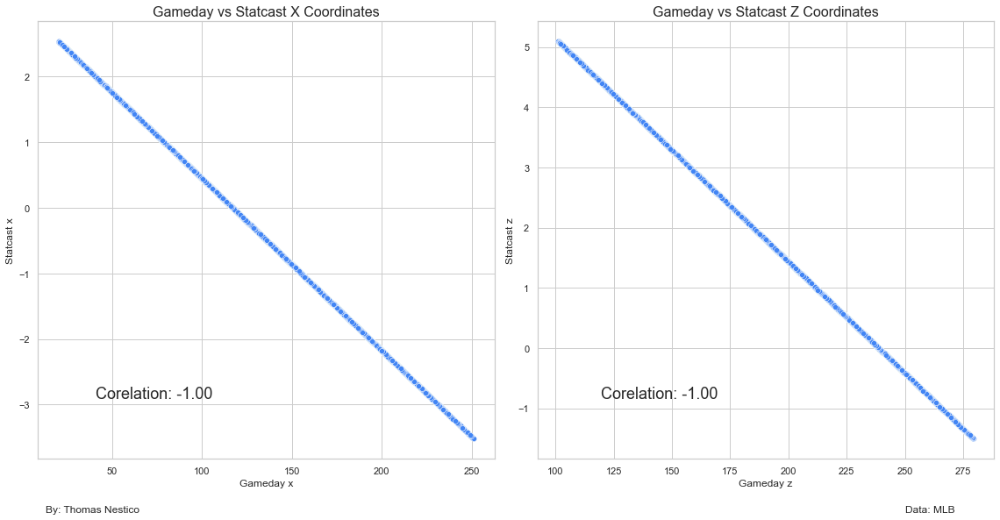

In [9]:
## Set up the axes
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(16,8))

## Plot Gameday x coordinate vs Statcast x coordinate
sns.scatterplot(data=df,x='pitch_x_gameday',y='pitch_x_statcast',ax=ax[0],c=["#4285F4"])
ax[0].set_ylabel('Statcast x')
ax[0].set_xlabel('Gameday x')
fig.text(s=f"Corelation: {round(df['pitch_x_gameday'].corr(df['pitch_x_statcast']),2):.2f}",x=0.1,y=0.2,fontsize=18)

## Plot Gameday z coordinate vs Statcast z coordinate
sns.scatterplot(data=df,x=df['pitch_z_gameday'],y=df['pitch_z_statcast'],ax=ax[1],c=["#4285F4"])
ax[1].set_ylabel('Statcast z')
ax[1].set_xlabel('Gameday z')
fig.text(s=f"Corelation: {round(df['pitch_z_gameday'].corr(df['pitch_z_statcast']),2):.2f}",x=0.6,y=0.2,fontsize=18)


fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('Gameday vs Statcast X Coordinates',fontsize=16)
ax[1].set_title('Gameday vs Statcast Z Coordinates',fontsize=16)
plt.tight_layout()

### Training a Classification Model - Random Forest

A Random Forest Model is an ensemble method that combines multiple decision trees, providing robust performance and handling complex decision boundaries. In short, the model creates the boundary of each class from its features to predict the class of an input data point. Additionally, the zones are bounded by simple polygons, which allows for straightforward classification, which Random Forest can handle.


The features of the Random Forest are the following:
* pitch_x_gameday:
    * MLB Gameday X Coordinates
* pitch_z_gameday:
    * MLB Gameday Z Coordinates
* k_zone_top:
    * Top of the batter's strike zone set by the operator when the ball is halfway to the plate.
* k_zone_bot:
    * Bottom of the batter's strike zone set by the operator when the ball is halfway to the plate

The target of the Random Forest is the following:
* Zone:
    * Zone location of the ball when it crosses the plate from the catcher's perspective

These features were selected as they define the location of the pitch and the size of the strikezone. The top and bottom of the strikezone varies between batters, as the size of the strikezone is proportional to the height of the batter. Considering these features will assist in producing an accurate model to predict the zone of each pitch.


In [10]:
# Import necessary libraries
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

features = ['pitch_x_gameday','pitch_z_gameday','k_zone_bottom','k_zone_top','pitch_x_statcast','pitch_z_statcast']
target = ['zone']
# create variable for feature data and target data
X = df[features].values
y = df[target].values

# y = target_data.replace(True,1)
# y = target_data.replace(False,0)
# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

# Create and train a Random Forest model
random_forest_model = RandomForestClassifier(n_estimators=100, random_state=42)
random_forest_model.fit(X_train[:,[0,1,2,3]], y_train)

# Make predictions on the test data
y_pred = random_forest_model.predict(X_test[:,[0,1,2,3]])

# Calculate accuracy and print a classification report
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

<ipython-input-10-e1c2f7622792>:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  random_forest_model.fit(X_train[:,[0,1,2,3]], y_train)


Accuracy: 0.96
              precision    recall  f1-score   support

         1.0       0.92      0.93      0.93      9152
         2.0       0.94      0.94      0.94     10987
         3.0       0.93      0.92      0.93      8051
         4.0       0.94      0.94      0.94     12616
         5.0       0.95      0.95      0.95     15916
         6.0       0.94      0.95      0.94     12781
         7.0       0.95      0.95      0.95     10229
         8.0       0.95      0.95      0.95     13398
         9.0       0.94      0.95      0.94     11809
        11.0       0.97      0.97      0.97     24048
        12.0       0.96      0.96      0.96     17479
        13.0       0.98      0.97      0.97     26830
        14.0       0.98      0.98      0.98     39218

    accuracy                           0.96    212514
   macro avg       0.95      0.95      0.95    212514
weighted avg       0.96      0.96      0.96    212514



### Assessing The Model

Now that we have a Random Forest trained, we should assess it. The accuracy of the model is 96%, which is a very strong indicator that the model is effective. Let’s look deeper into it and plot the Testing Data to compare the actual Zone Classifications to the Predicted Zone Classifications. The data was limited to 5000 points for clarity.

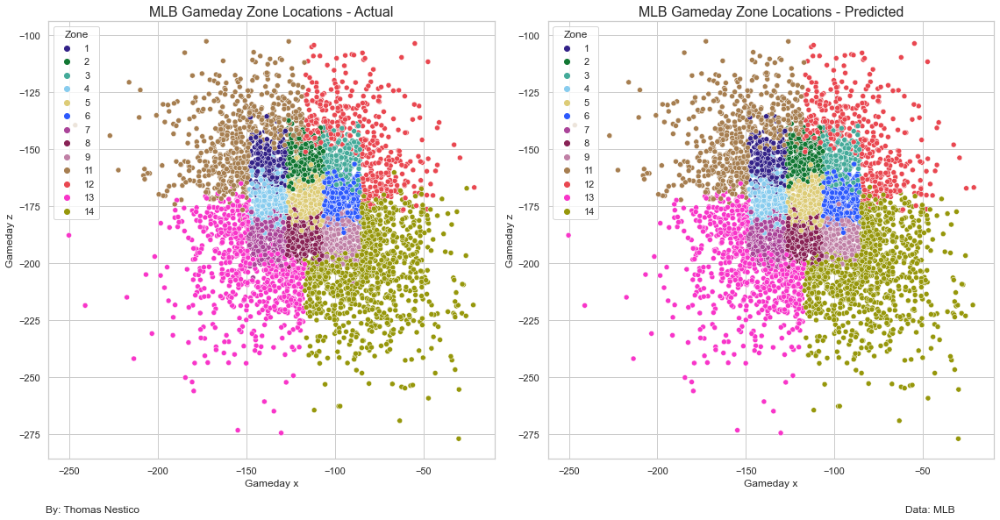

In [11]:
## Set Up Plot and Style
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(16,8))

## Use a colour-blind friendly palette to distinguish zones.
pal = ['#332288','#117733','#44AA99','#88CCEE','#DDCC77','#2C59FD','#AA4499','#882255','#C080A6','#A67E50','#E94750','#F835C9','#96970B']
### Plot the first 5000 Points for simplicity
## Plot Gameday Pitch Locations, Multiply both x and y by -1 to rotate by 180°
sns.scatterplot(x=X_test[:,[0]][0:5000][:,0]*-1,y=X_test[:,[1]][0:5000][:,0]*-1,hue=[int(t) for t in y_test[:][0:5000][:,0]],ax=ax[0],palette=pal)
## Plot Gameday Pitch Locations, Multiply both x and y by -1 to rotate by 180°
sns.scatterplot(x=X_test[:,[0]][0:5000][:,0]*-1,y=X_test[:,[1]][0:5000][:,0]*-1,hue=[int(t) for t in random_forest_model.predict(X_test[:,[0,1,2,3]][0:5000])],ax=ax[1],palette=pal)

## Add titles and Text
fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('MLB Gameday Zone Locations - Actual',fontsize=16)
ax[1].set_title('MLB Gameday Zone Locations - Predicted',fontsize=16)

ax[0].legend(title='Zone')
ax[1].legend(title='Zone')

ax[0].set_ylabel('Gameday z')
ax[0].set_xlabel('Gameday x')

ax[1].set_ylabel('Gameday z')
ax[1].set_xlabel('Gameday x')


plt.tight_layout()

The model seems to be performing well. The model uses more than 2 features, so a scatter plot will not be able to capture all the dimensions of the model, but we can take a look at a confusion matrix to understand the distribution of predicted results vs actual results.

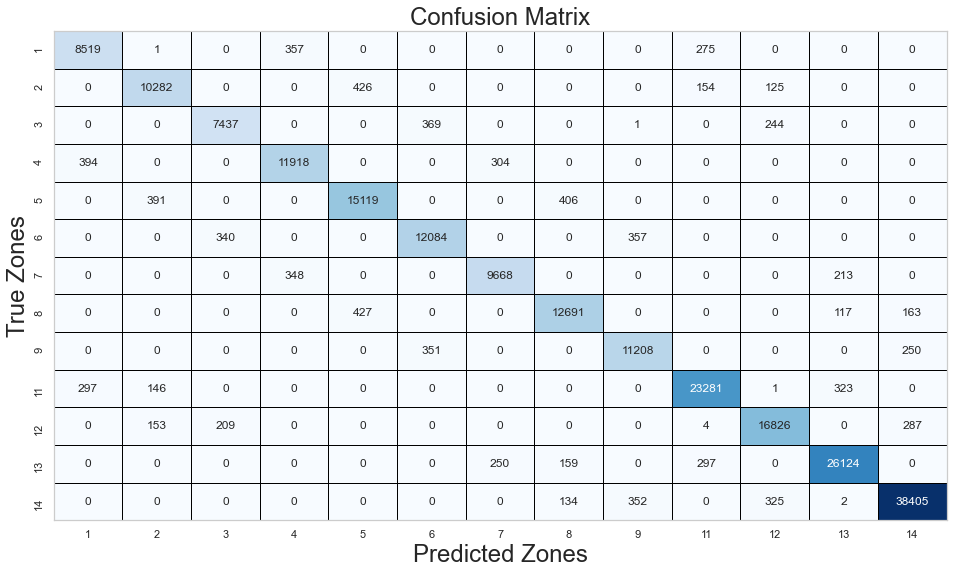

In [12]:
# Import necessary libraries
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(16,9))
# Assuming y_true contains the true labels and y_pred contains the predicted labels
# Replace these with your actual true and predicted labels
y_true = y_test[:][:][:,0]
y_pred = random_forest_model.predict(X_test[:,[0,1,2,3]][:])

# Create a confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix as a heatmap
sns.heatmap(cm, annot=True, fmt="d",linewidths=1,linecolor='black', cmap="Blues", cbar=False,ax=ax,xticklabels=set(np.array(y_true).astype(int)),yticklabels=set(np.array(y_true).astype(int)))

for _, spine in ax.spines.items():
    spine.set_visible(True)

ax.set_xlabel("Predicted Zones",fontsize=24)
ax.set_ylabel("True Zones",fontsize=24)
ax.set_title("Confusion Matrix",fontsize=24)
plt.show()


The high accuracy of the model is clearly presented in this matrix. The largest discrepancies occur between zones which are vertically adjacent to one another. This makes sense as the horizontal size of the strikezone does not change, but the vertical size is variable, mostly defined by the height of the batter.

We can use the predicted zone locations to also predict whether a pitch was In-Zone or Out-of-Zone.


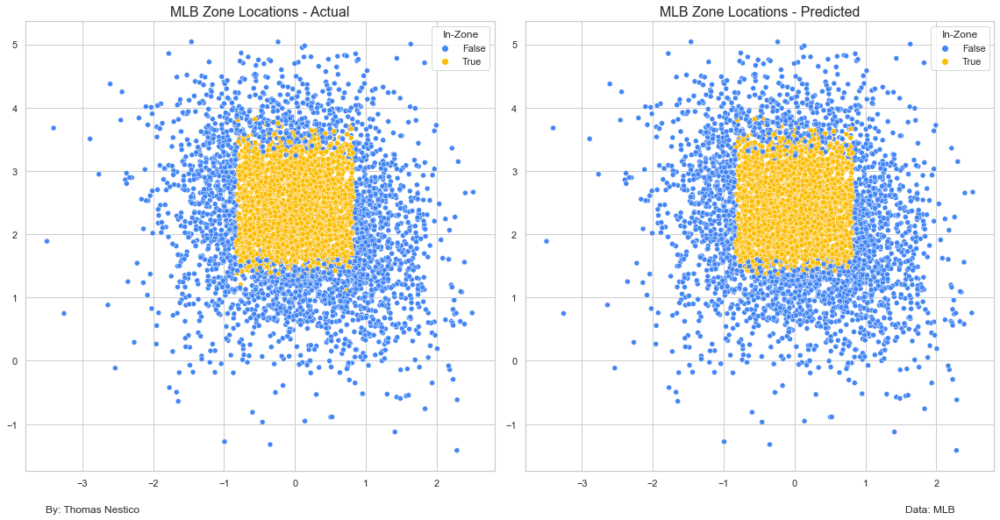

In [13]:
## Set Up Plot and Style
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(16,8))


### Plot the first 5000 Points for simplicity
## Plot Statcast Pitch Locations
# sns.scatterplot(x='pitch_x_statcast',y='pitch_z_statcast',hue=df['zone'].head(5000),ax=ax[0],palette=pal)
# # Plot Gameday Pitch Locations, Multiply both x and y by -1 to rotate by 180°
# sns.scatterplot(data=df.head(5000),x=df.head(5000)['pitch_x_gameday']*1,y=df.head(5000)['pitch_z_gameday']*1,hue=knn.predict(X[0:5000]),ax=ax[1],palette=pal)
sns.scatterplot(x=X_test[:,[-2]][0:5000][:,0]*1,y=X_test[:,[-1]][0:5000][:,0]*1,hue=y_test[:][0:5000][:,0]<10,ax=ax[0],palette=["#4285F4",'#FBBC04'])
# # Plot Gameday Pitch Locations, Multiply both x and y by -1 to rotate by 180°
sns.scatterplot(x=X_test[:,[-2]][0:5000][:,0]*1,y=X_test[:,[-1]][0:5000][:,0]*1,hue=random_forest_model.predict(X_test[:,[0,1,2,3]][0:5000])<10,ax=ax[1],palette=["#4285F4",'#FBBC04'])



## Add titles and Text
fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('MLB Zone Locations - Actual',fontsize=16)
ax[1].set_title('MLB Zone Locations - Predicted',fontsize=16)

ax[0].legend(title='In-Zone')
ax[1].legend(title='In-Zone')


plt.tight_layout()

We can also plot a confusion matrix for In-Zone vs Out-of-Zone predictions to see the distribution of true positive, true negative, false positive, and false negative predictions.

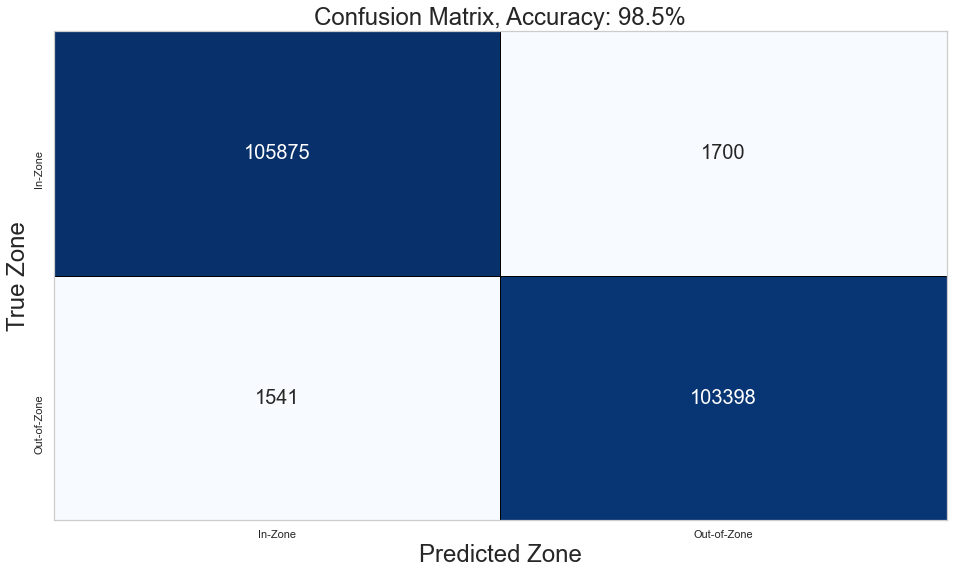

In [14]:
# Import necessary libraries
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(16,9))
# Assuming y_true contains the true labels and y_pred contains the predicted labels
# Replace these with your actual true and predicted labels
y_true = y_test[:][:][:,0]<10
y_pred = random_forest_model.predict(X_test[:,[0,1,2,3]][:])<10

# Create a confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display the confusion matrix as a heatmap
sns.heatmap(cm, annot=True,annot_kws={"size": 20}, fmt="d",linewidths=1,linecolor='black', cmap="Blues", cbar=False,ax=ax,xticklabels=['In-Zone','Out-of-Zone'],yticklabels=['In-Zone','Out-of-Zone'])
for _, spine in ax.spines.items():
    spine.set_visible(True)


ax.set_xlabel("Predicted Zone",fontsize=24)
ax.set_ylabel("True Zone",fontsize=24)
ax.set_title(f"Confusion Matrix, Accuracy: {accuracy_score(y_true, y_pred):.1%}",fontsize=24)

plt.show()


For predicting whether a pitch was “In-Zone” or “Out-of-Zone” the model has a 98% accuracy.

We now have two models trained:
1) A linear Regression model which predicts Statcast Coordinates given Gameday Coordinates
2) A Random Forest Classifier which predicts zones given Statcast coordinates.


## Predicting MiLB Zone Metrics

All Minor League Baseball (MiLB) Games have Gameday data, but not all MiLB Games have Statcast Data. We can use the models we trained to predict the zone of each MiLB Pitch and also calculate Zone metrics.


### Limitations
We do come into some limitations with the MiLB pitch data.
1) MiLB Pitch Data is manually recorded, unlike how MLB Pitch Data is recorded through Hawkeye Cameras to get exact measurements. Due to the manual nature of the pitch tracking, errors in the data are much more likely.
2) When there is room for human error, the predictions made on the model may not be accurate.
Knowing these limitations and the issues they may pose, we can take a look at the High-A pitch location distribution and get a sense of the MiLB data.


### High-A Pitch Location Distribution
This analysis will focus on the 2023 High-A Season. The data was gathered from the MLB Stats API.

In [15]:
## Read in High_a Data
single_a_df = pd.read_csv('data/single_a_pitch.csv')

## Predict Statcast Locations using Gameday locations
single_a_df['pitch_x_statcast_new'] = linear_reg_model_x.predict(np.array(single_a_df[['pitch_x_gameday']]))
single_a_df['pitch_z_statcast_new'] = linear_reg_model_z.predict(np.array(single_a_df[['pitch_z_gameday']]))

## Predict Zones using Predicted Statcast Locations
features = ['pitch_x_gameday','pitch_z_gameday','k_zone_bottom','k_zone_top','pitch_x_statcast_new','pitch_z_statcast_new']
single_a_df['zone'] = random_forest_model.predict(single_a_df[features[0:4]].values)
single_a_df['in_zone'] = single_a_df['zone'] < 10

Let's take a look at the distribution of pitches during the 2023 High-A Season.

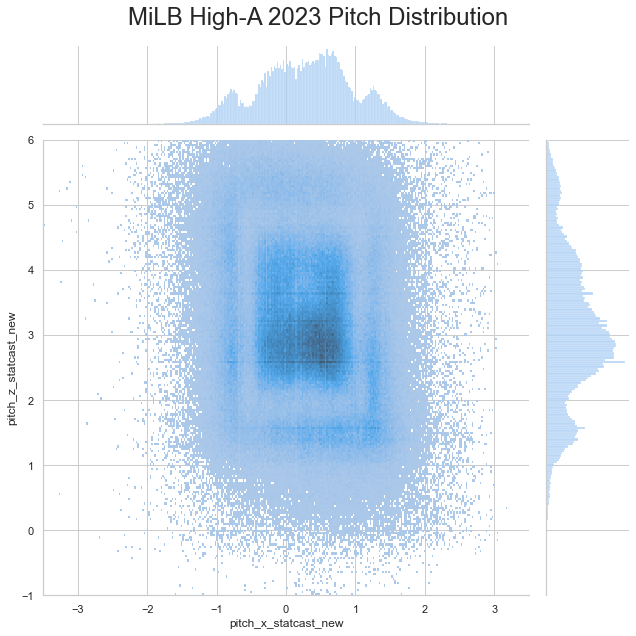

In [16]:
sns.set_theme(style="whitegrid", palette="pastel")
hc = sns.jointplot(data=single_a_df, x="pitch_x_statcast_new", y="pitch_z_statcast_new",height=9,kind='hist',xlim=(-3.5,3.5),ylim=(-1,6))
hc.fig.suptitle("MiLB High-A 2023 Pitch Distribution",fontsize=24)
hc.fig.subplots_adjust(top=0.92)

Unfortunately, it seems as if the manual tracked data from the 2023 High-A data is not normally distributed like the MLB Statcast locations were. While this won’t impact the ability of the zone prediction model, it most likely means that the model is making predictions on a large portion of inaccurate data.

We will continue with prediction of pitch zones. There is an understanding that the accuracy of the predictions may be in question, but we will assume that the data collection was accurate enough that meaningful analysis can be conducted.

Let’s plot the predicted zones of the data.


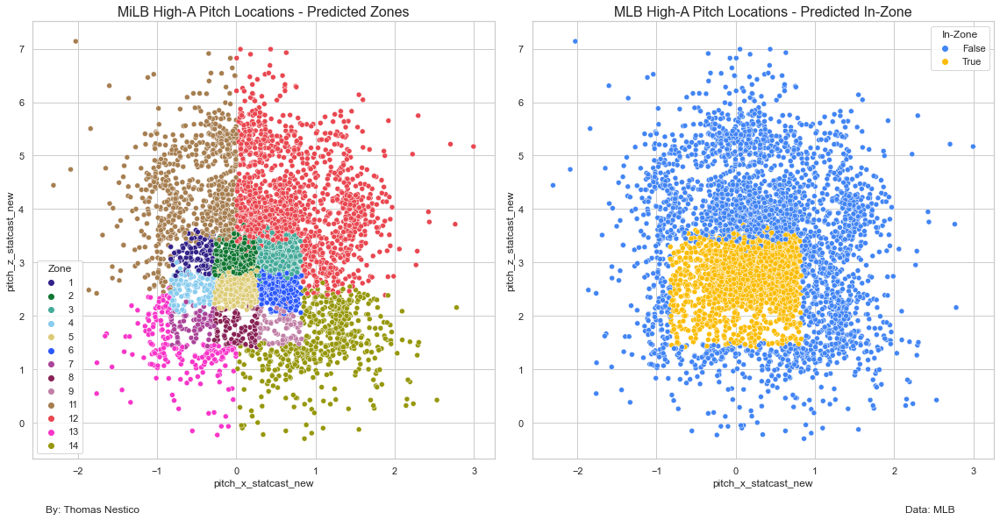

In [17]:
## Set Up Plot and Style
sns.set_theme(style="whitegrid", palette="pastel")
fig, ax = plt.subplots(1,2,figsize=(16,8))


### Plot the first 5000 Points for simplicity
## Plot Statcast Pitch Locations and Zones
sns.scatterplot(x=single_a_df['pitch_x_statcast_new'][0:5000]*1,y=single_a_df['pitch_z_statcast_new'][0:5000]*1,hue=[int(t) for t in single_a_df['zone'][0:5000]],ax=ax[0],palette=pal)
sns.scatterplot(x=single_a_df['pitch_x_statcast_new'][0:5000]*1,y=single_a_df['pitch_z_statcast_new'][0:5000]*1,hue=single_a_df['zone'][0:5000]<10,ax=ax[1],palette=["#4285F4",'#FBBC04'])

## Add titles and Text
fig.text(s='By: Thomas Nestico',x=0.05,y=-0.025,ha='left')
fig.text(s='Data: MLB',x=1-0.05,y=-0.025,ha='right')
ax[0].set_title('MiLB High-A Pitch Locations - Predicted Zones',fontsize=16)
ax[1].set_title('MLB High-A Pitch Locations - Predicted In-Zone',fontsize=16)

ax[0].legend(title='Zone')
ax[1].legend(title='In-Zone')


plt.tight_layout()

The model classifies the data into its distinct clusters effectively. With these predictions, we can calculate High-A Zone Metrics.

In [18]:
## Set up lists for different events
swing_codes = ['Swinging Strike', 'In play, no out', 
        'Foul', 'In play, out(s)', 
       'In play, run(s)', 'Swinging Strike (Blocked)',
       'Foul Bunt','Foul Tip', 'Missed Bunt']

swings_in = ['Swinging Strike', 'In play, no out', 
        'Foul', 'In play, out(s)', 
       'In play, run(s)', 'Swinging Strike (Blocked)',
       'Foul Bunt','Foul Tip', 'Missed Bunt']       

swing_strike_codes = ['Swinging Strike',
 'Swinging Strike (Blocked)','Missed Bunt','Foul Tip']


contact_codes = ['In play, no out', 
        'Foul', 'In play, out(s)', 
       'In play, run(s)', 
       'Foul Bunt']

codes_in = ['In play, out(s)',
'Swinging Strike',
'Ball',
'Foul',
'In play, no out',
'Called Strike',
'Foul Tip',
'In play, run(s)',
'Hit By Pitch',
'Ball In Dirt',
'Pitchout',
'Swinging Strike (Blocked)',
'Foul Bunt',
'Missed Bunt']

## Assign 1 and 0 for each event
single_a_df['pitches'] = 1
single_a_df['whiffs'] = [1 if ((x == 'S')|(x == 'W')|(x =='T')) else 0 for x in single_a_df.code]
single_a_df['csw'] = [1 if ((x == 'S')|(x == 'W')|(x =='T')|(x == 'C')) else 0 for x in single_a_df.code]
single_a_df['swings'] = [1 if x in swings_in else 0 for x in single_a_df.description]

## Group In-Zone and Out-of-Zone pitches separately
single_a_df_in_zone = single_a_df[single_a_df.in_zone].groupby(['batter_id','batter'])[['pitches','swings','whiffs']].sum()
single_a_df_out_zone = single_a_df[~single_a_df.in_zone].groupby(['batter_id','batter'])[['pitches','swings','whiffs']].sum()

## Merge In-Zone and Out-of-Zone Groups
single_a_df_sum = single_a_df_in_zone.merge(right=single_a_df_out_zone,left_index=True,right_index=True,suffixes=['_in_zone','_out_zone'],how='outer').fillna(0).astype(int)
single_a_df_sum['pitches'] = single_a_df_sum['pitches_in_zone'] + single_a_df_sum['pitches_out_zone']
single_a_df_sum['swings'] = single_a_df_sum['swings_in_zone'] + single_a_df_sum['swings_out_zone']
single_a_df_sum['whiffs'] = single_a_df_sum['whiffs_in_zone'] + single_a_df_sum['whiffs_out_zone']

## Calculate Rates
# rate_columns are 'swing_rate','whiff_rate','sw_str_rate','z_rate','z_swing_rate','z_whiff_rate','o_rate','o_swing_rate','o_whiff_rate'

single_a_df_sum['swing_rate'] = (single_a_df_sum['swings_in_zone'] + single_a_df_sum['swings_out_zone']) / (single_a_df_sum['pitches_in_zone'] + single_a_df_sum['pitches_out_zone'])
single_a_df_sum['whiff_rate'] = (single_a_df_sum['whiffs_in_zone'] + single_a_df_sum['whiffs_out_zone']) / (single_a_df_sum['swings_in_zone'] + single_a_df_sum['swings_out_zone'])
single_a_df_sum['sw_str_rate'] = (single_a_df_sum['whiffs_in_zone'] + single_a_df_sum['whiffs_out_zone']) / (single_a_df_sum['pitches_in_zone'] + single_a_df_sum['pitches_out_zone'])

single_a_df_sum['z_rate'] = (single_a_df_sum['pitches_in_zone']) / (single_a_df_sum['pitches'])
single_a_df_sum['z_swing_rate'] = (single_a_df_sum['swings_in_zone']) / (single_a_df_sum['pitches_in_zone'])
single_a_df_sum['z_whiff_rate'] = (single_a_df_sum['whiffs_in_zone']) / (single_a_df_sum['swings_in_zone'])
single_a_df_sum['o_rate'] = (single_a_df_sum['pitches_out_zone']) / (single_a_df_sum['pitches'])
single_a_df_sum['o_swing_rate'] = (single_a_df_sum['swings_out_zone']) / (single_a_df_sum['pitches_out_zone'])
single_a_df_sum['o_whiff_rate'] = (single_a_df_sum['whiffs_out_zone']) / (single_a_df_sum['swings_out_zone'])

## Export to CSV
single_a_df_sum.to_csv('output/high_a_zone_metrics.csv')

### High-A Zone Metric Plots
The following scatter plots illustrate zone metrics for High-A batters which saw 1500 pitches during the 2023 season. In each plot, the top right quadrant is most favourable for the batter.

<ipython-input-19-fb80b7efcbe9>:21: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar  = ax.figure.colorbar(sm, ax=ax,orientation='vertical',aspect=30,format=mtick.PercentFormatter(1,decimals=0))


[Text(0.6171107994389902, 0.18022657054582905, 'Griffin Lockwood-Powell'), Text(0.6839677047289504, 0.28324468085106386, "D'Shawn Knowles"), Text(0.617351598173516, 0.23804226918798665, 'Junior Perez'), Text(0.6376089663760897, 0.24334140435835352, 'Luis Toribio'), Text(0.7457886676875957, 0.3129459734964322, 'Wilderd Patino'), Text(0.6500530222693531, 0.27802690582959644, 'Danny Bautista Jr.'), Text(0.6692913385826772, 0.27362637362637365, 'Joe Stewart'), Text(0.6670520231213873, 0.2894033837934105, 'Brady Allen'), Text(0.6081871345029239, 0.20368239355581128, 'Noah Cardenas'), Text(0.5831099195710456, 0.23905325443786982, 'Nick Ward'), Text(0.6224961479198767, 0.26550598476605003, 'Isaac De Leon'), Text(0.7465145754119138, 0.24817518248175183, 'Nic Kent'), Text(0.658669574700109, 0.2837988826815642, 'Marcus Lee Sang'), Text(0.6118935837245696, 0.21965317919075145, 'Dalton Rushing'), Text(0.6315289648622981, 0.2722086389568052, 'Grant McCray'), Text(0.5787631271878646, 0.2125534950071

500

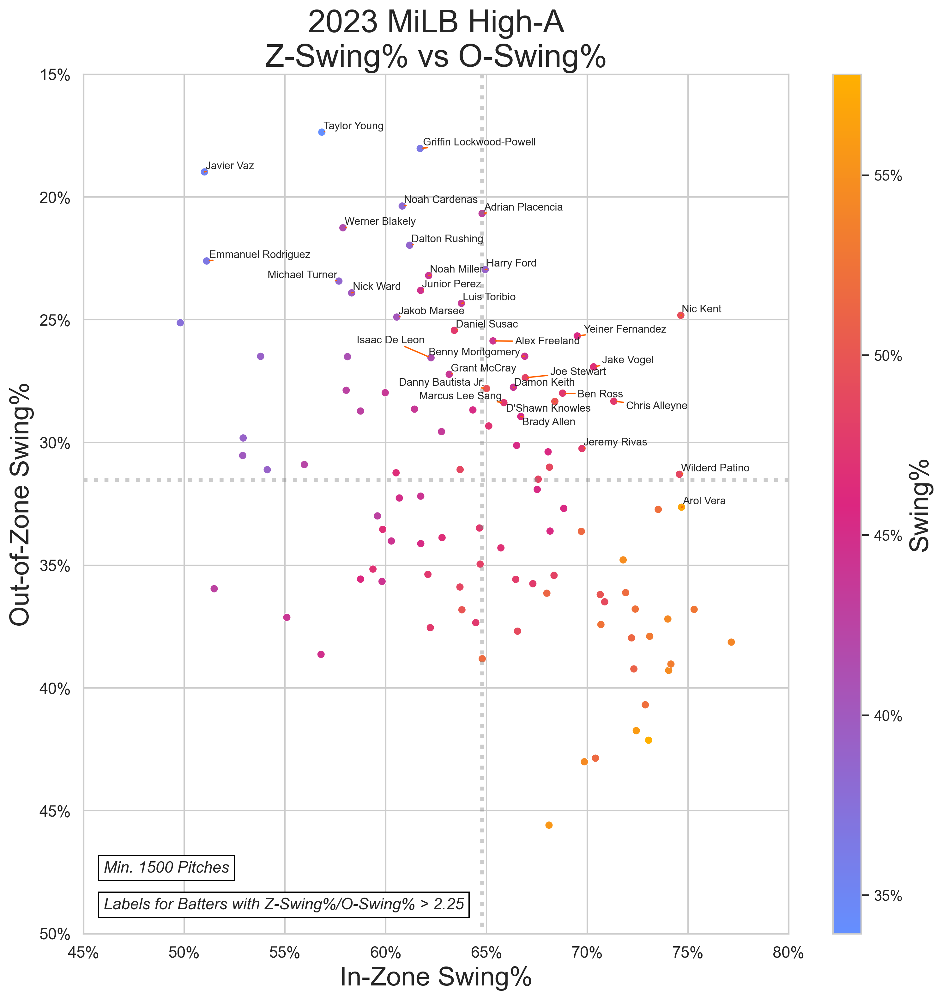

In [19]:
import matplotlib
import matplotlib.ticker as mtick
import math
from adjustText import adjust_text

colour_palette = ['#FFB000','#648FFF','#785EF0',
                  '#DC267F','#FE6100','#3D1EB2','#894D80','#16AA02','#B5592B','#A3C1ED']

fig, ax = plt.subplots(1,1,figsize=(12,12),dpi=300)


plot_df = single_a_df_sum[single_a_df_sum.pitches>=1500]

cmap_hue = matplotlib.colors.LinearSegmentedColormap.from_list("", [colour_palette[1],colour_palette[3],colour_palette[0]])
norm = plt.Normalize(plot_df['swing_rate'].min(), plot_df['swing_rate'].max())


sns.scatterplot(data=plot_df,x='z_swing_rate',y='o_swing_rate',hue='swing_rate',palette=cmap_hue)

sm = plt.cm.ScalarMappable(cmap=cmap_hue, norm=norm)
cbar  = ax.figure.colorbar(sm, ax=ax,orientation='vertical',aspect=30,format=mtick.PercentFormatter(1,decimals=0))
cbar.set_label('Swing%',fontsize=20)



ax.hlines(xmin=(math.floor((plot_df['z_swing_rate'].min()*100-0.01)/5))*5/100,
            xmax= (math.ceil((plot_df['z_swing_rate'].max()*100+0.01)/5))*5/100,
            y=plot_df['o_swing_rate'].mean(),color='gray',linewidth=3,linestyle='dotted',alpha=0.4)

ax.vlines(ymin=(math.floor((plot_df['o_swing_rate'].min()*100-0.01)/5))*5/100,
            ymax= (math.ceil((plot_df['o_swing_rate'].max()*100+0.01)/5))*5/100,
            x=plot_df['z_swing_rate'].mean(),color='gray',linewidth=3,linestyle='dotted',alpha=0.4)



ax.set_xlim((math.floor((plot_df['z_swing_rate'].min()*100)/5))*5/100,
            (math.ceil((plot_df['z_swing_rate'].max()*100)/5))*5/100)


ax.set_ylim((math.floor((plot_df['o_swing_rate'].min()*100)/5))*5/100,
            (math.ceil((plot_df['o_swing_rate'].max()*100)/5))*5/100)


ax.xaxis.set_major_formatter(mtick.PercentFormatter(1,decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1,decimals=0))
ax.tick_params(axis='both', which='major', labelsize=12)

fig.axes[0].invert_yaxis()
ax.set_xlabel('In-Zone Swing%',fontsize=20)
ax.set_ylabel('Out-of-Zone Swing%',fontsize=20)

ax.get_legend().remove()

ax.set_title('2023 MiLB High-A\nZ-Swing% vs O-Swing%',fontsize=24)

ts=[]

thresh = 2.25
for i in range(len(plot_df)):
        if (plot_df['z_swing_rate'].values[i]/ plot_df['o_swing_rate'].values[i]) >= thresh:
            ts.append(ax.text(plot_df['z_swing_rate'].values[i], plot_df['o_swing_rate'].values[i], plot_df.index.get_level_values(1).values[i],fontsize=8))

ax.text(x=0.46,y=0.475,s='Min. 1500 Pitches',fontsize='12',fontstyle='oblique',
        bbox=dict(facecolor='white', edgecolor='black'))
ax.text(x=0.46,y=0.49,s=f'Labels for Batters with Z-Swing%/O-Swing% > {thresh}',fontsize='12',fontstyle='oblique',
        bbox=dict(facecolor='white', edgecolor='black'))

print(ts)
adjust_text(ts,
            arrowprops=dict(arrowstyle="-", color=colour_palette[4], lw=1),ax=ax)


<ipython-input-20-c815639f8f3d>:20: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar  = ax.figure.colorbar(sm, ax=ax,orientation='vertical',aspect=30,format=mtick.PercentFormatter(1,decimals=0))


[Text(0.12071778140293637, 0.25806451612903225, 'Danny Bautista Jr.'), Text(0.17872340425531916, 0.21656050955414013, 'Ezequiel Pagan'), Text(0.19310344827586207, 0.1782178217821782, 'Nick Ward'), Text(0.19915254237288135, 0.2806603773584906, 'Geraldo Quintero'), Text(0.1631578947368421, 0.21846153846153846, 'Tres Gonzalez'), Text(0.176056338028169, 0.24537037037037038, 'Dylan Beavers'), Text(0.125, 0.23766816143497757, 'Michael Turner'), Text(0.17836812144212524, 0.24262295081967214, 'Osvaldo Tovalin'), Text(0.19426048565121412, 0.25, 'Jake Fox'), Text(0.17375231053604437, 0.22093023255813954, 'Frederick Bencosme'), Text(0.13345864661654136, 0.2508591065292096, 'Nathan Church'), Text(0.19166666666666668, 0.24404761904761904, 'Joe Lampe'), Text(0.1534090909090909, 0.14084507042253522, 'Jakob Marsee'), Text(0.16551724137931034, 0.2038369304556355, 'Ignacio Alvarez'), Text(0.085995085995086, 0.09655172413793103, 'Javier Vaz')]


150

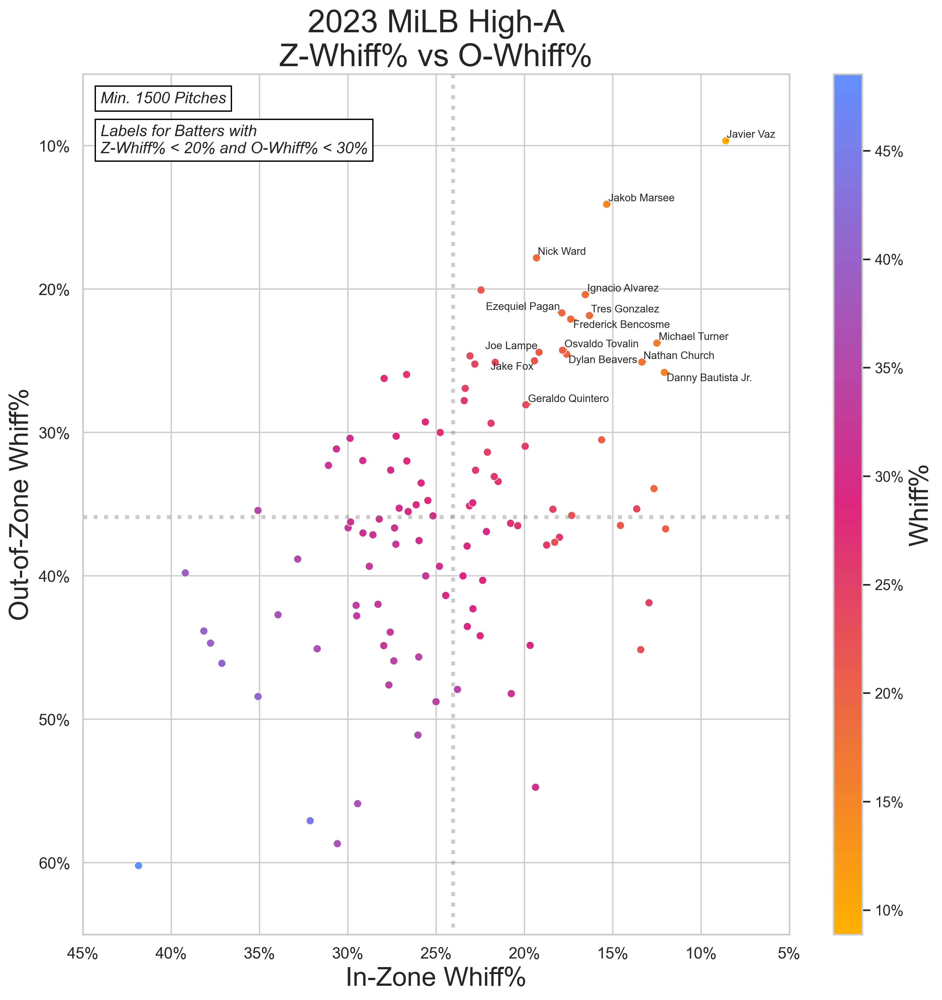

In [20]:
import matplotlib
import matplotlib.ticker as mtick
import math
from adjustText import adjust_text

fig, ax = plt.subplots(1,1,figsize=(12,12),dpi=300)


plot_df = single_a_df_sum[single_a_df_sum.pitches>=1500]

cmap_hue = matplotlib.colors.LinearSegmentedColormap.from_list("", [colour_palette[0],colour_palette[3],colour_palette[1]])
norm = plt.Normalize(plot_df['whiff_rate'].min(), plot_df['whiff_rate'].max())


sns.scatterplot(data=plot_df,x='z_whiff_rate',y='o_whiff_rate',hue='whiff_rate',palette=cmap_hue)
colour_palette = ['#FFB000','#648FFF','#785EF0',
                  '#DC267F','#FE6100','#3D1EB2','#894D80','#16AA02','#B5592B','#A3C1ED']

sm = plt.cm.ScalarMappable(cmap=cmap_hue, norm=norm)
cbar  = ax.figure.colorbar(sm, ax=ax,orientation='vertical',aspect=30,format=mtick.PercentFormatter(1,decimals=0))
cbar.set_label('Whiff%',fontsize=20)



ax.hlines(xmin=(math.floor((plot_df['z_whiff_rate'].min()*100-0.01)/5))*5/100,
            xmax= (math.ceil((plot_df['z_whiff_rate'].max()*100+0.01)/5))*5/100,
            y=plot_df['o_whiff_rate'].mean(),color='gray',linewidth=3,linestyle='dotted',alpha=0.4)

ax.vlines(ymin=(math.floor((plot_df['o_whiff_rate'].min()*100-0.01)/5))*5/100,
            ymax= (math.ceil((plot_df['o_whiff_rate'].max()*100+0.01)/5))*5/100,
            x=plot_df['z_whiff_rate'].mean(),color='gray',linewidth=3,linestyle='dotted',alpha=0.4)



ax.set_xlim((math.floor((plot_df['z_whiff_rate'].min()*100)/5))*5/100,
            (math.ceil((plot_df['z_whiff_rate'].max()*100)/5))*5/100)


ax.set_ylim((math.floor((plot_df['o_whiff_rate'].min()*100)/5))*5/100,
            (math.ceil((plot_df['o_whiff_rate'].max()*100)/5))*5/100)


ax.xaxis.set_major_formatter(mtick.PercentFormatter(1,decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1,decimals=0))
ax.tick_params(axis='both', which='major', labelsize=12)

fig.axes[0].invert_xaxis()
fig.axes[0].invert_yaxis()
ax.set_xlabel('In-Zone Whiff%',fontsize=20)
ax.set_ylabel('Out-of-Zone Whiff%',fontsize=20)

ax.get_legend().remove()

ax.set_title('2023 MiLB High-A\nZ-Whiff% vs O-Whiff%',fontsize=24)

ts=[]

thresh = 0.8
for i in range(len(plot_df)):
        if (plot_df['z_whiff_rate'].values[i]) <= 0.2 and \
           (plot_df['o_whiff_rate'].values[i]) <= 0.3:
            ts.append(ax.text(plot_df['z_whiff_rate'].values[i], plot_df['o_whiff_rate'].values[i], plot_df.index.get_level_values(1).values[i],fontsize=8))

ax.text(x=0.44,y=0.07,s='Min. 1500 Pitches',fontsize='12',fontstyle='oblique',
        bbox=dict(facecolor='white', edgecolor='black'))
ax.text(x=0.44,y=0.105,s=f'Labels for Batters with\nZ-Whiff% < 20% and O-Whiff% < 30%',fontsize='12',fontstyle='oblique',
        bbox=dict(facecolor='white', edgecolor='black'))

print(ts)
adjust_text(ts,
            arrowprops=dict(arrowstyle="-", color=colour_palette[4], lw=1),ax=ax)


<ipython-input-21-c08a59286bba>:20: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar  = ax.figure.colorbar(sm, ax=ax,orientation='vertical',aspect=30,format=mtick.PercentFormatter(1,decimals=0))


[Text(0.1340909090909091, 0.18022657054582905, 'Griffin Lockwood-Powell'), Text(0.12071778140293637, 0.27802690582959644, 'Danny Bautista Jr.'), Text(0.15625, 0.20368239355581128, 'Noah Cardenas'), Text(0.19310344827586207, 0.23905325443786982, 'Nick Ward'), Text(0.1873589164785553, 0.28718535469107553, 'Misael Urbina'), Text(0.1731748726655348, 0.24817518248175183, 'Nic Kent'), Text(0.1631578947368421, 0.2981651376146789, 'Tres Gonzalez'), Text(0.176056338028169, 0.2787096774193548, 'Dylan Beavers'), Text(0.14559386973180077, 0.2566079295154185, 'Yeiner Fernandez'), Text(0.1827956989247312, 0.2543171114599686, 'Daniel Susac'), Text(0.125, 0.2342436974789916, 'Michael Turner'), Text(0.1936619718309859, 0.2648698884758364, 'Benny Montgomery'), Text(0.13345864661654136, 0.28641732283464566, 'Nathan Church'), Text(0.1534090909090909, 0.24890446976336547, 'Jakob Marsee'), Text(0.085995085995086, 0.18979057591623036, 'Javier Vaz'), Text(0.12660550458715597, 0.17358490566037735, 'Taylor Youn

151

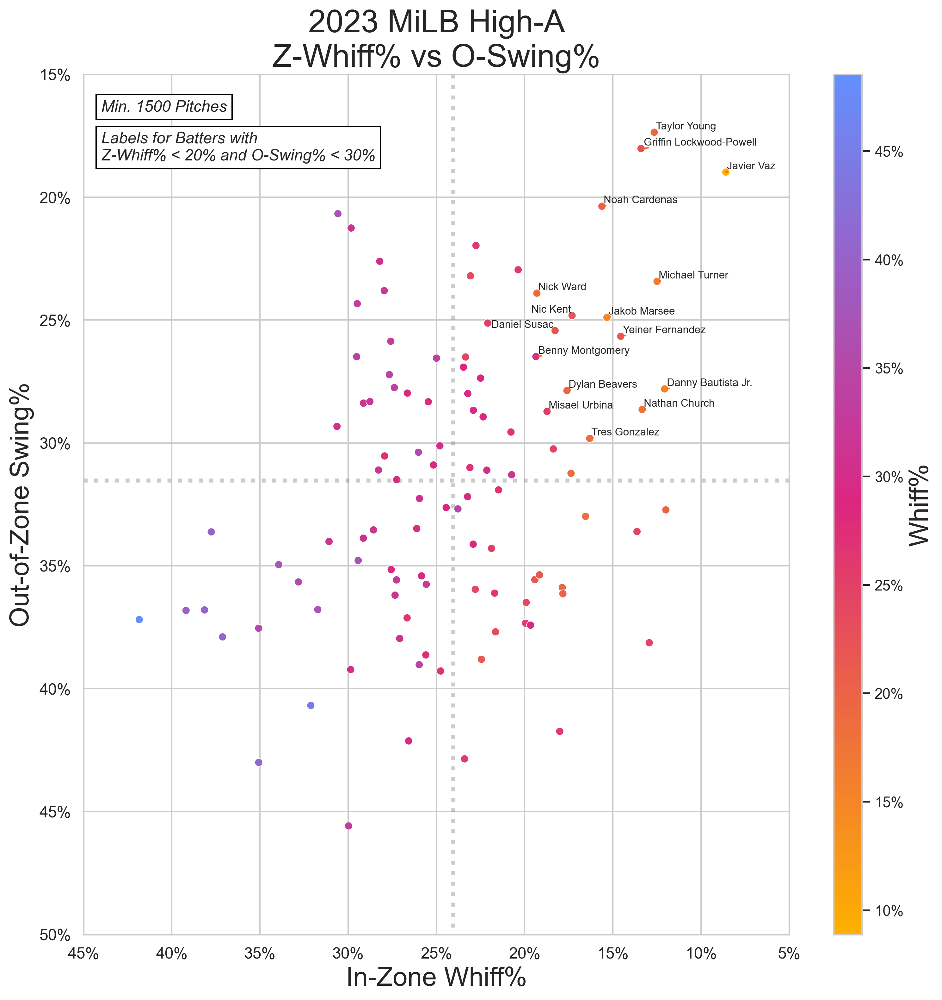

In [21]:
import matplotlib
import matplotlib.ticker as mtick
import math
from adjustText import adjust_text

fig, ax = plt.subplots(1,1,figsize=(12,12),dpi=300)


plot_df = single_a_df_sum[single_a_df_sum.pitches>=1500]

cmap_hue = matplotlib.colors.LinearSegmentedColormap.from_list("", [colour_palette[0],colour_palette[3],colour_palette[1]])
norm = plt.Normalize(plot_df['whiff_rate'].min(), plot_df['whiff_rate'].max())


sns.scatterplot(data=plot_df,x='z_whiff_rate',y='o_swing_rate',hue='whiff_rate',palette=cmap_hue)
colour_palette = ['#FFB000','#648FFF','#785EF0',
                  '#DC267F','#FE6100','#3D1EB2','#894D80','#16AA02','#B5592B','#A3C1ED']

sm = plt.cm.ScalarMappable(cmap=cmap_hue, norm=norm)
cbar  = ax.figure.colorbar(sm, ax=ax,orientation='vertical',aspect=30,format=mtick.PercentFormatter(1,decimals=0))
cbar.set_label('Whiff%',fontsize=20)



ax.hlines(xmin=(math.floor((plot_df['z_whiff_rate'].min()*100-0.01)/5))*5/100,
            xmax= (math.ceil((plot_df['z_whiff_rate'].max()*100+0.01)/5))*5/100,
            y=plot_df['o_swing_rate'].mean(),color='gray',linewidth=3,linestyle='dotted',alpha=0.4)

ax.vlines(ymin=(math.floor((plot_df['o_swing_rate'].min()*100-0.01)/5))*5/100,
            ymax= (math.ceil((plot_df['o_swing_rate'].max()*100+0.01)/5))*5/100,
            x=plot_df['z_whiff_rate'].mean(),color='gray',linewidth=3,linestyle='dotted',alpha=0.4)



ax.set_xlim((math.floor((plot_df['z_whiff_rate'].min()*100)/5))*5/100,
            (math.ceil((plot_df['z_whiff_rate'].max()*100)/5))*5/100)


ax.set_ylim((math.floor((plot_df['o_swing_rate'].min()*100)/5))*5/100,
            (math.ceil((plot_df['o_swing_rate'].max()*100)/5))*5/100)


ax.xaxis.set_major_formatter(mtick.PercentFormatter(1,decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1,decimals=0))
ax.tick_params(axis='both', which='major', labelsize=12)

fig.axes[0].invert_xaxis()
fig.axes[0].invert_yaxis()
ax.set_xlabel('In-Zone Whiff%',fontsize=20)
ax.set_ylabel('Out-of-Zone Swing%',fontsize=20)

ax.get_legend().remove()

ax.set_title('2023 MiLB High-A\nZ-Whiff% vs O-Swing%',fontsize=24)

ts=[]

thresh = 0.8
for i in range(len(plot_df)):
        if (plot_df['z_whiff_rate'].values[i]) <= 0.2 and \
           (plot_df['o_swing_rate'].values[i]) <= 0.3:
            ts.append(ax.text(plot_df['z_whiff_rate'].values[i], plot_df['o_swing_rate'].values[i], plot_df.index.get_level_values(1).values[i],fontsize=8))

ax.text(x=0.44,y=0.165,s='Min. 1500 Pitches',fontsize='12',fontstyle='oblique',
        bbox=dict(facecolor='white', edgecolor='black'))
ax.text(x=0.44,y=0.185,s=f'Labels for Batters with\nZ-Whiff% < 20% and O-Swing% < 30%',fontsize='12',fontstyle='oblique',
        bbox=dict(facecolor='white', edgecolor='black'))

print(ts)
adjust_text(ts,
            arrowprops=dict(arrowstyle="-", color=colour_palette[4], lw=1),ax=ax)


## Conclusion
Plate discipline metrics which account for the location of the pitch a batter faces provide a deeper understanding of a batter’s plate approach and swing tendencies. Through the use of Hawkeye and Statcast, the locations and metrics are accurately calculated and made accessible to the public. Unfortunately, MiLB metrics such as these are not provided by MLB and thus inaccuracies in the dataset will continue to be present until Statcast data for all MiLB parks become public. Through the training and testing of both a linear regression and a random forest classifier, zone locations were predicted for all pitches thrown during the 2023 MiLB High-A Season, and subsequently, zone metrics for all batters and pitchers were calculated. These metrics provide coaches, scouts, and analysts information needed to make decisions which will ultimately shape the future of baseball and its players.
